In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd

In [ ]:
df = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/EEN2020_DESIGN PRACTICAL EXPERIENCE/T_vs_C_diff_all.xlsx")
df

,Gene_Names,logFC,logCPM,LR,PValue
0,ENSMUSG00000032487.9:Ptgs2,11.256967,3.095134,23.499642,1.249370e-06
1,ENSMUSG00000119427.1:Gm24830,10.985829,2.834435,22.460808,2.144753e-06
2,ENSMUSG00000119774.1:Gm26232,10.985829,2.834435,22.460808,2.144753e-06
3,ENSMUSG00000118677.1:Rnu1b6,10.950429,2.800467,22.242859,2.402506e-06
4,ENSMUSG00000064380.3:Gm26448,10.887848,2.743674,21.930482,2.827075e-06
...,...,...,...,...,...
56948,ENSMUSG00000035864.15:Syt1,-9.859948,1.533402,33.670284,6.529050e-09
56949,ENSMUSG00000032186.16:Tmod2,-9.894628,1.569456,34.099043,5.237703e-09
56950,ENSMUSG00000090625.2:Gm20721,-10.101613,1.622257,34.256821,4.829797e-09
56951,ENSMUSG00000097451.12:Rian,-10.267729,1.952512,38.819300,4.649085e-10


In [ ]:
# !pip install bioinfokit
# from bioinfokit import analys, visuz

No. of Genes with logFC >= +2 is: 5752
No. of Genes with logFC <= -2 is: 2775
No. of Genes with -2 >= logFC >= +2 is: 8527


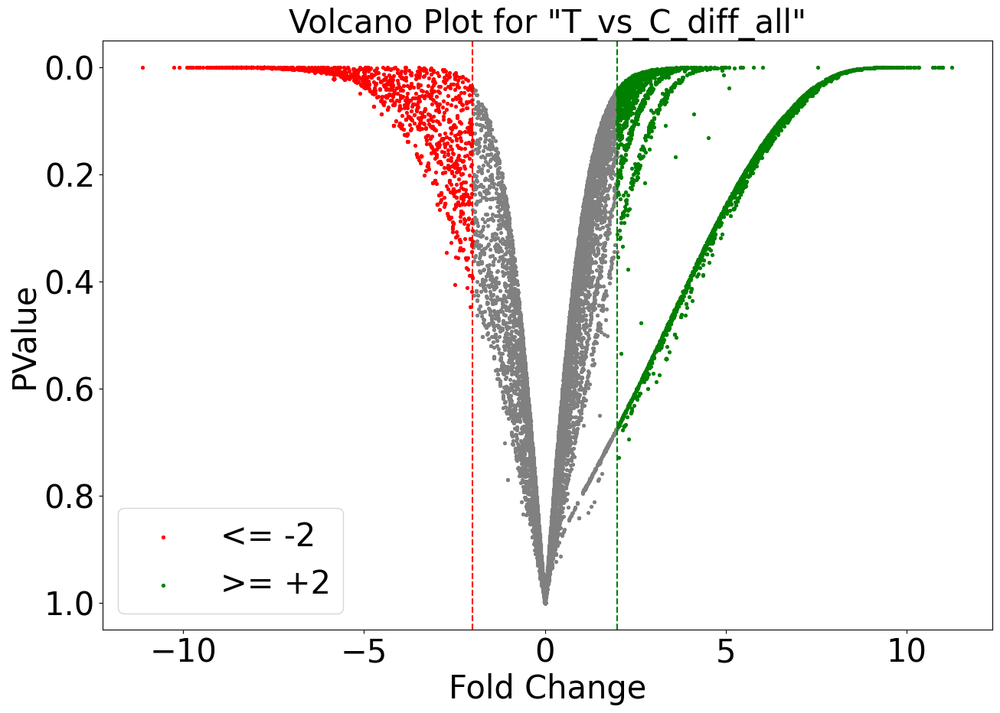

In [ ]:
import numpy as np

a_th = 2
b_th = 5

# Create the volcano plot
plt.figure(figsize=(15, 10))
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if (fc > -2 and fc < 2)],
            [p for fc, p in zip(df.logFC, df.PValue) if (fc > -2 and fc < 2)],
            color='gray', s=30, marker='.')

# Highlight significantly differentially expressed genes
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if fc <= -a_th],
            [p for fc, p in zip(df.logFC, df.PValue) if fc <= -a_th],
            color='red', label='<= -2', marker='.',s=30)
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if fc >= a_th],
            [p for fc, p in zip(df.logFC, df.PValue) if fc >= a_th],
            color='green', label='>= +2', marker='.',s=30)

print("No. of Genes with logFC >= +2 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if fc >= a_th]))
print("No. of Genes with logFC <= -2 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if fc <= -a_th]))
print("No. of Genes with -2 >= logFC >= +2 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if (fc >= a_th or fc <=-a_th)]))

# Set plot title and axis labels
plt.title('Volcano Plot for "T_vs_C_diff_all"', fontsize=30)
plt.xlabel('Fold Change', fontsize=30)
plt.ylabel('PValue', fontsize=30)
plt.ylim(max(df.PValue)+.05,min(df.PValue)-.05)

# Add horizontal line at the threshold
plt.axvline(x=-a_th, color='red', linestyle='--')
plt.axvline(x=a_th, color='green', linestyle='--')
plt.legend(fontsize=30)

ax = plt.gca()
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.show()


No. of Genes with +2 <= logFC <= +5 is: 4241
No. of Genes with -2 >= logFC >= -5 is: 1074
No. of Genes with -2 >= logFC >= +5 and +2<= logFC <= +5 is: 5315


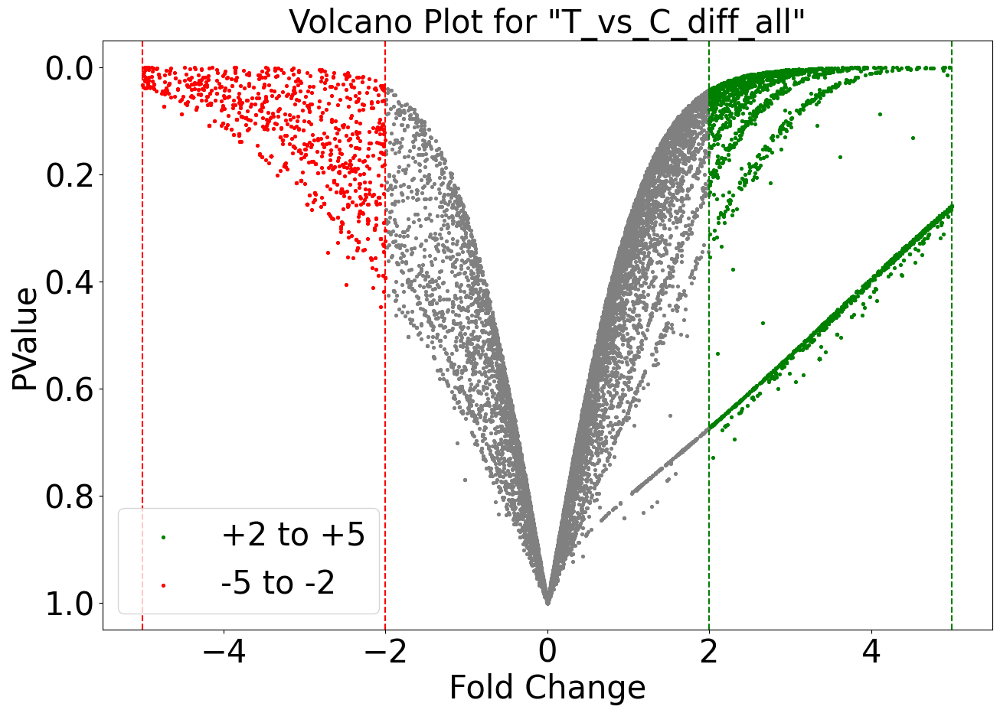

In [ ]:
import numpy as np

a_th = 2
b_th = 5

# Create the volcano plot
plt.figure(figsize=(15, 10))
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if (fc > -2 and fc < 2)],
            [p for fc, p in zip(df.logFC, df.PValue) if (fc > -2 and fc < 2)],
            color='gray', s=30, marker='.')

# Highlight significantly differentially expressed genes
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if (fc >= a_th and fc <= b_th)],
            [p for fc, p in zip(df.logFC, df.PValue) if (fc >= a_th and fc <= b_th)],
            color='green', label='+2 to +5', marker='.', s=30)
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if (fc <= -a_th and fc >= -b_th)],
            [p for fc, p in zip(df.logFC, df.PValue) if (fc <= -a_th and fc >= -b_th)],
            color='red', label='-5 to -2', s=30, marker='.')

print("No. of Genes with +2 <= logFC <= +5 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if (fc >= a_th and fc <= b_th)]))
print("No. of Genes with -2 >= logFC >= -5 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if (fc <= -a_th and fc >= -b_th)]))
print("No. of Genes with -2 >= logFC >= +5 and +2<= logFC <= +5 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if ((fc >= a_th and fc <= b_th) or (fc <= -a_th and fc >= -b_th))]))

# Set plot title and axis labels
plt.title('Volcano Plot for "T_vs_C_diff_all"',fontsize=30)
plt.xlabel('Fold Change',fontsize=30)
plt.ylabel('PValue',fontsize=30)
plt.ylim(max(df.PValue)+.05,min(df.PValue)-.05)

# Add horizontal line at the threshold
plt.axvline(x=-a_th, color='red', linestyle='--')
plt.axvline(x=a_th, color='green', linestyle='--')
plt.axvline(x=-b_th, color='red', linestyle='--')
plt.axvline(x=b_th, color='green', linestyle='--')
plt.legend(fontsize=30)
ax = plt.gca()
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()


No. of Genes with logFC >= +5 is: 1511
No. of Genes with logFC <= -5 is: 1701
No. of Genes with -5 >= logFC >= +5 is: 3212
No. of Genes with logFC >= +10 is: 17
No. of Genes with logFC <= -10 is: 3
No. of Genes with -10 >= logFC >= +10 is: 20


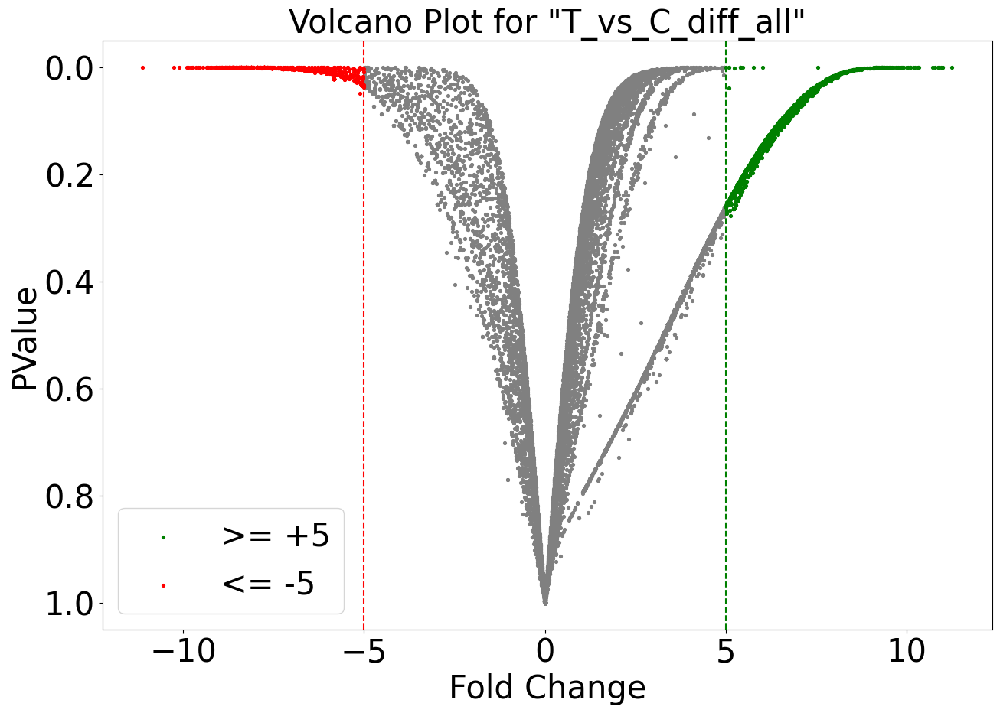

In [ ]:
a_th = 5

# Create the volcano plot
plt.figure(figsize=(15, 10))
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if (fc > -5 and fc < 5)],
            [p for fc, p in zip(df.logFC, df.PValue) if (fc > -5 and fc < 5)],
            color='gray', s=30, marker='.')

# Highlight significantly differentially expressed genes
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if fc >= a_th],
            [p for fc, p in zip(df.logFC, df.PValue) if fc >= a_th],
            color='green', label='>= +5', s=30, marker='.')
plt.scatter([fc for fc, p in zip(df.logFC, df.PValue) if fc <= -a_th],
            [p for fc, p in zip(df.logFC, df.PValue) if fc <= -a_th],
            color='red', label='<= -5', s=30, marker='.')

print("No. of Genes with logFC >= +5 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if fc >= b_th]))
print("No. of Genes with logFC <= -5 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if fc <= -b_th]))
print("No. of Genes with -5 >= logFC >= +5 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if (fc >= b_th or fc <=-b_th)]))
print("No. of Genes with logFC >= +10 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if fc >= 10]))
print("No. of Genes with logFC <= -10 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if fc <= -10]))
print("No. of Genes with -10 >= logFC >= +10 is:", len([fc for fc, p in zip(df.logFC, df.PValue) if (fc >= 10 or fc <=-10)]))

plt.title('Volcano Plot for "T_vs_C_diff_all"',fontsize=30)
plt.xlabel('Fold Change',fontsize=30)
plt.ylabel('PValue',fontsize=30)
plt.ylim(max(df.PValue)+.05,min(df.PValue)-.05)

# Add horizontal line at the threshold
plt.axvline(x=-a_th, color='red', linestyle='--')
plt.axvline(x=a_th, color='green', linestyle='--')
plt.legend(fontsize=30)
ax = plt.gca()
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

In [ ]:
# fig1 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc >= 5 or fc <= -5)],
#             y=[p for fc, p in zip(df.logFC, df.PValue) if (fc >= 5 or fc <= -5)],
#             text=[p for fc, p in zip(df.logFC, df.Gene_Names) if (fc >= 5 or fc <= -5)],
#                   labels={'text': 'Data Points'})
fig1 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc <=5) or (fc <= -2 and fc>=-5))],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc <=5) or (fc <= -2 and fc>=-5))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc >= 2 and fc <=5) or (fc <= -2 and fc>=-5))])
fig3 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc < 2 and fc > -2)],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc < 2 and fc > -2))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc < 2 and fc > -2))])

# fig1.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig1.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig3.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')

fig1.update_layout(
    showlegend=True,
    width = 1400,
    height = 800,
    xaxis_title="Fold Change",
    yaxis_title="PValue",
    title="Volcano Plot for 'T_vs_C_diff_all'",
    title_font=dict(size=30),
    xaxis=dict(title_font=dict(size=30)),
    yaxis=dict(title_font=dict(size=30)),
    font=dict(size=30),
    title_x=0.5)
fig1.update_yaxes(range=[max(df.PValue)+.05,min(df.PValue)-.05])

# fig1.update_traces(marker=dict(color='green'))
fig1.update_traces(marker=dict(color='red'))
fig3.update_traces(marker=dict(color='gray'))


fig4 = px.line(x=[5,5],y=[-0.5,1.5])
fig5 = px.line(x=[-5,-5],y=[-0.5,1.5])
fig6 = px.line(x=[2,2],y=[-0.5,1.5])
fig7 = px.line(x=[-2,-2],y=[-0.5,1.5])
# for trace in fig2.data:
#     fig1.add_trace(trace)
for trace in fig3.data:
    fig1.add_trace(trace)
for trace in fig4.data:
    fig1.add_trace(trace)
for trace in fig5.data:
    fig1.add_trace(trace)
for trace in fig6.data:
    fig1.add_trace(trace)
for trace in fig7.data:
    fig1.add_trace(trace)
fig1.update_xaxes(tickfont=dict(size=30))
fig1.update_yaxes(tickfont=dict(size=30))

fig1.show()

In [ ]:
fig1 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc >= 5 or fc <= -5)],
            y=[p for fc, p in zip(df.logFC, df.PValue) if (fc >= 5 or fc <= -5)],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if (fc >= 5 or fc <= -5)],
                  labels={'text': 'Data Points'})
fig2 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc <=5) or (fc <= -2 and fc>=-5))],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc <=5) or (fc <= -2 and fc>=-5))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc >= 2 and fc <=5) or (fc <= -2 and fc>=-5))])
fig3 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc < 2 and fc > -2)],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc < 2 and fc > -2))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc < 2 and fc > -2))])

fig1.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig2.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig3.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')

fig1.update_layout(
    showlegend=True,
    width = 1400,
    height = 800,
    xaxis_title="Fold Change",
    yaxis_title="PValue",
    title="Volcano Plot for 'T_vs_C_diff_all'",
    title_font=dict(size=30),
    xaxis=dict(title_font=dict(size=30)),
    yaxis=dict(title_font=dict(size=30)),
    font=dict(size=30),
    title_x=0.5)
fig1.update_yaxes(range=[max(df.PValue)+.05,min(df.PValue)-.05])

fig1.update_traces(marker=dict(color='green'))
fig2.update_traces(marker=dict(color='gray'))
fig3.update_traces(marker=dict(color='gray'))


fig4 = px.line(x=[5,5],y=[-0.5,1.5])
fig5 = px.line(x=[-5,-5],y=[-0.5,1.5])
fig6 = px.line(x=[2,2],y=[-0.5,1.5])
fig7 = px.line(x=[-2,-2],y=[-0.5,1.5])
for trace in fig2.data:
    fig1.add_trace(trace)
for trace in fig3.data:
    fig1.add_trace(trace)
for trace in fig4.data:
    fig1.add_trace(trace)
for trace in fig5.data:
    fig1.add_trace(trace)
for trace in fig6.data:
    fig1.add_trace(trace)
for trace in fig7.data:
    fig1.add_trace(trace)

fig1.update_xaxes(tickfont=dict(size=30))
fig1.update_yaxes(tickfont=dict(size=30))
fig1.show()

In [ ]:
fig1 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if ((fc >= 5 and fc < 10) or (fc <= -5 and fc > -10))],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc >= 5 and fc < 10) or (fc <= -5 and fc > -10))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc >= 5 and fc < 10) or (fc <= -5 and fc > -10))],
                  labels={'text': 'Data Points'})
fig2 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc < 5) or (fc <= -2 and fc> -5))],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc < 5) or (fc <= -2 and fc> -5))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc >= 2 and fc < 5) or (fc <= -2 and fc> -5))])
fig3 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc < 2 and fc > -2)],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc < 2 and fc > -2))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc < 2 and fc > -2))])
fig8 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc >= 10 or fc <=-10)],
            y=[p for fc, p in zip(df.logFC, df.PValue) if (fc >= 10 or fc <=-10)],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if (fc >= 10 or fc <=-10)])

fig1.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig2.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig3.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig8.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')

fig1.update_layout(
    showlegend=True,
    width = 1400,
    height = 800,
    xaxis_title="Fold Change",
    yaxis_title="PValue",
    title="Volcano Plot for 'T_vs_C_diff_all'",
    title_font=dict(size=30),
    xaxis=dict(title_font=dict(size=30)),
    yaxis=dict(title_font=dict(size=30)),
    font=dict(size=30),
    title_x=0.5)
fig1.update_yaxes(range=[max(df.PValue)+.05,min(df.PValue)-.05])

fig8.update_traces(marker=dict(color='green'))
fig1.update_traces(marker=dict(color='gray'))
fig2.update_traces(marker=dict(color='gray'))
fig3.update_traces(marker=dict(color='gray'))


fig4 = px.line(x=[5,5],y=[-0.5,1.5])
fig5 = px.line(x=[-5,-5],y=[-0.5,1.5])
fig6 = px.line(x=[2,2],y=[-0.5,1.5])
fig7 = px.line(x=[-2,-2],y=[-0.5,1.5])
fig9 = px.line(x=[-10,-10],y=[-0.5,1.5])
fig10 = px.line(x=[10,10],y=[-0.5,1.5])
for trace in fig2.data:
    fig1.add_trace(trace)
for trace in fig3.data:
    fig1.add_trace(trace)
for trace in fig4.data:
    fig1.add_trace(trace)
for trace in fig5.data:
    fig1.add_trace(trace)
for trace in fig6.data:
    fig1.add_trace(trace)
for trace in fig7.data:
    fig1.add_trace(trace)
for trace in fig8.data:
    fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig10.data:
    fig1.add_trace(trace)

fig1.update_xaxes(tickfont=dict(size=30))
fig1.update_yaxes(tickfont=dict(size=30))
fig1.show()

In [ ]:
fig1 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if ((fc >= 5 and fc < 10) or (fc <= -5 and fc > -10))],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc >= 5 and fc < 10) or (fc <= -5 and fc > -10))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc >= 5 and fc < 10) or (fc <= -5 and fc > -10))],
                  labels={'text': 'Data Points'})
fig2 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc < 5) or (fc <= -2 and fc> -5))],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc >= 2 and fc < 5) or (fc <= -2 and fc> -5))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc >= 2 and fc < 5) or (fc <= -2 and fc> -5))])
fig3 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc < 2 and fc > -2)],
            y=[p for fc, p in zip(df.logFC, df.PValue) if ((fc < 2 and fc > -2))],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if ((fc < 2 and fc > -2))])
fig8 = px.scatter(x=[fc for fc, p in zip(df.logFC, df.PValue) if (fc >= 10 or fc <=-10)],
            y=[p for fc, p in zip(df.logFC, df.PValue) if (fc >= 10 or fc <=-10)],
            text=[p for fc, p in zip(df.logFC, df.Gene_Names) if (fc >= 10 or fc <=-10)])

fig1.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig2.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig3.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')
fig8.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>PValue: %{y}')

fig1.update_layout(
    showlegend=True,
    width = 1400,
    height = 800,
    xaxis_title="Fold Change",
    yaxis_title="PValue",
    title="Volcano Plot for 'T_vs_C_diff_all'",
    title_font=dict(size=30),
    xaxis=dict(title_font=dict(size=30)),
    yaxis=dict(title_font=dict(size=30)),
    font=dict(size=30),
    title_x=0.5)
fig1.update_yaxes(range=[max(df.PValue)+.05,min(df.PValue)-.05])

fig8.update_traces(marker=dict(color='green'))
fig1.update_traces(marker=dict(color='darkorange'))
fig2.update_traces(marker=dict(color='red'))
fig3.update_traces(marker=dict(color='gray'))


fig4 = px.line(x=[5,5],y=[-0.5,1.5])
fig5 = px.line(x=[-5,-5],y=[-0.5,1.5])
fig6 = px.line(x=[2,2],y=[-0.5,1.5])
fig7 = px.line(x=[-2,-2],y=[-0.5,1.5])
fig9 = px.line(x=[-10,-10],y=[-0.5,1.5])
fig10 = px.line(x=[10,10],y=[-0.5,1.5])
for trace in fig2.data:
    fig1.add_trace(trace)
for trace in fig3.data:
    fig1.add_trace(trace)
for trace in fig4.data:
    fig1.add_trace(trace)
for trace in fig5.data:
    fig1.add_trace(trace)
for trace in fig6.data:
    fig1.add_trace(trace)
for trace in fig7.data:
    fig1.add_trace(trace)
for trace in fig8.data:
    fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig10.data:
    fig1.add_trace(trace)

fig1.update_xaxes(tickfont=dict(size=30))
fig1.update_yaxes(tickfont=dict(size=30))
fig1.show()

In [ ]:
df['Gene'] = df['Gene_Names']
df['GeneID'] = df['Gene_Names']
for i,j in enumerate(df['Gene_Names']):
  for l,k in enumerate(j):
    if (k==':'):
      df.Gene[i] = j[l+1:]
      df.GeneID[i] = j[:l]

df

,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,ENSMUSG00000032487.9:Ptgs2,11.256967,3.095134,23.499642,1.249370e-06,Ptgs2,ENSMUSG00000032487.9
1,ENSMUSG00000119427.1:Gm24830,10.985829,2.834435,22.460808,2.144753e-06,Gm24830,ENSMUSG00000119427.1
2,ENSMUSG00000119774.1:Gm26232,10.985829,2.834435,22.460808,2.144753e-06,Gm26232,ENSMUSG00000119774.1
3,ENSMUSG00000118677.1:Rnu1b6,10.950429,2.800467,22.242859,2.402506e-06,Rnu1b6,ENSMUSG00000118677.1
4,ENSMUSG00000064380.3:Gm26448,10.887848,2.743674,21.930482,2.827075e-06,Gm26448,ENSMUSG00000064380.3
...,...,...,...,...,...,...,...
56948,ENSMUSG00000035864.15:Syt1,-9.859948,1.533402,33.670284,6.529050e-09,Syt1,ENSMUSG00000035864.15
56949,ENSMUSG00000032186.16:Tmod2,-9.894628,1.569456,34.099043,5.237703e-09,Tmod2,ENSMUSG00000032186.16
56950,ENSMUSG00000090625.2:Gm20721,-10.101613,1.622257,34.256821,4.829797e-09,Gm20721,ENSMUSG00000090625.2
56951,ENSMUSG00000097451.12:Rian,-10.267729,1.952512,38.819300,4.649085e-10,Rian,ENSMUSG00000097451.12


In [ ]:
uni = df['Gene'].unique()
len(uni)

55252

In [ ]:
nms = ["Padi3", "Ldhb", "Ero1a", "Mpo", "Pdcd6ip", "Ltf", "Myh9", "Ldhc", "Tkt", "Vdac2", "Eif5a",
       "Padi1", "Padi4", "Ero1b", "Padi2", "Lcp1", "Slc25a31", "Hspa9", "Anxa2", "Cat", "Eif5a2",
       "Padi6", "Slc25a5", "Eno1", "Sod1", "Ptma", "Actn4", "Prkca", "Tuba1b","Eef2", "Vdac3",
       "Elane", "Ak2", "Mdh2", "Calu", "Lyz1", "Lyz2","Hsp90ab1", "Hspa5", "P4hb", "Cct7"]
len(nms)

41

###grater than +5 and less than -5

In [ ]:
df_5_1 = df[df['logFC'] >= 5]
df_5_2 = df[df['logFC'] <= -5]
df_n5 = df_5_1.append(df_5_2)
# df_n5.sort_values(by=['logFC'])
df_n5.reset_index()

,index,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,0,ENSMUSG00000032487.9:Ptgs2,11.256967,3.095134,23.499642,1.249370e-06,Ptgs2,ENSMUSG00000032487.9
1,1,ENSMUSG00000119427.1:Gm24830,10.985829,2.834435,22.460808,2.144753e-06,Gm24830,ENSMUSG00000119427.1
2,2,ENSMUSG00000119774.1:Gm26232,10.985829,2.834435,22.460808,2.144753e-06,Gm26232,ENSMUSG00000119774.1
3,3,ENSMUSG00000118677.1:Rnu1b6,10.950429,2.800467,22.242859,2.402506e-06,Rnu1b6,ENSMUSG00000118677.1
4,4,ENSMUSG00000064380.3:Gm26448,10.887848,2.743674,21.930482,2.827075e-06,Gm26448,ENSMUSG00000064380.3
...,...,...,...,...,...,...,...,...
3207,56948,ENSMUSG00000035864.15:Syt1,-9.859948,1.533402,33.670284,6.529050e-09,Syt1,ENSMUSG00000035864.15
3208,56949,ENSMUSG00000032186.16:Tmod2,-9.894628,1.569456,34.099043,5.237703e-09,Tmod2,ENSMUSG00000032186.16
3209,56950,ENSMUSG00000090625.2:Gm20721,-10.101613,1.622257,34.256821,4.829797e-09,Gm20721,ENSMUSG00000090625.2
3210,56951,ENSMUSG00000097451.12:Rian,-10.267729,1.952512,38.819300,4.649085e-10,Rian,ENSMUSG00000097451.12


Mean: -0.27661257914059706
Standard Deviation: 6.533874922017441
Standard Error of the Mean (SEM): 0.1152877194207734
The Total no of genes in the required dataste are :  3212


Text(0.5, 1.0, 'grater than +5 and less than -5')

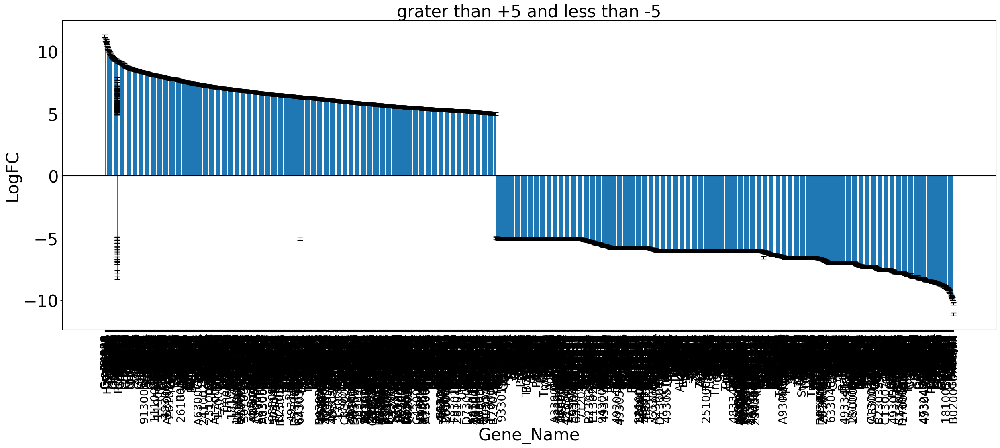

In [ ]:
x = df_n5['Gene']
y = df_n5['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,10))
plt.bar(x, y, yerr = standard_error_mean, capsize = 5)
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=20)
plt.yticks(fontsize=30)
plt.ylabel('LogFC',fontsize=30)
plt.title('grater than +5 and less than -5',fontsize=30)

###between +5 and +7 & between -5 and -7

In [ ]:
df_57_1 = df[df['logFC'] >= 5]
df_57_1 = df_57_1[df_57_1['logFC'] <= 7]
df_57_2 = df[df['logFC'] <= -5]
df_57_2 = df_57_2[df_57_2['logFC'] >= -7]
df_n57 = df_57_1.append(df_57_2)
# df_n57.sort_values(by=['logFC'])
df_n57.reset_index()

,index,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,461,ENSMUSG00000067370.5:B3galt4,6.995623,-0.915246,3.154457,0.075720,B3galt4,ENSMUSG00000067370.5
1,462,ENSMUSG00000053411.17:Cbx7,6.995003,-0.708685,3.292572,0.069594,Cbx7,ENSMUSG00000053411.17
2,463,ENSMUSG00000048970.10:C1galt1c1,6.991066,-0.555765,3.451234,0.063205,C1galt1c1,ENSMUSG00000048970.10
3,464,ENSMUSG00000036022.16:Fam122b,6.990996,-0.639898,3.360573,0.066775,Fam122b,ENSMUSG00000036022.16
4,465,ENSMUSG00000092595.3:Gm20427,6.986189,-0.559385,3.442438,0.063542,Gm20427,ENSMUSG00000092595.3
...,...,...,...,...,...,...,...,...
2382,56584,ENSMUSG00000113100.2:Gm48754,-6.988610,-1.407117,8.661171,0.003251,Gm48754,ENSMUSG00000113100.2
2383,56585,ENSMUSG00000120499.1:,-6.988610,-1.407117,8.661171,0.003251,,ENSMUSG00000120499.1
2384,56586,ENSMUSG00000120976.1:,-6.988610,-1.407117,8.661171,0.003251,,ENSMUSG00000120976.1
2385,56587,ENSMUSG00000031342.18:Gpm6b,-6.989090,1.491981,22.858226,0.000002,Gpm6b,ENSMUSG00000031342.18


Mean: -0.707786919561791
Standard Deviation: 5.880106281866814
Standard Error of the Mean (SEM): 0.12035356704371684
The Total no of genes in the required dataste are :  2387


Text(0.5, 1.0, 'between +5 and +7 & between -5 and -7')

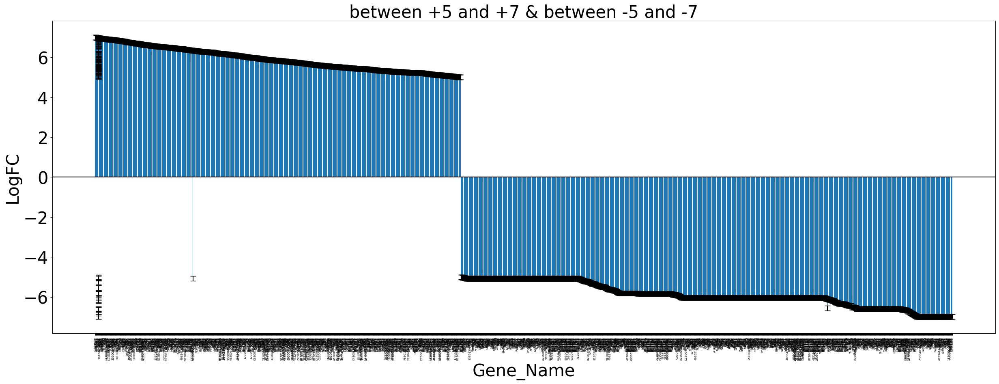

In [ ]:
x = df_n57['Gene']
y = df_n57['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,10))
plt.bar(x, y, yerr = standard_error_mean, capsize = 5)
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=5)
plt.yticks(fontsize=30)
plt.ylabel('LogFC',fontsize=30)
plt.title('between +5 and +7 & between -5 and -7',fontsize=30)

###between +7 and +8 & between -7 and -8

In [ ]:
df_78_1 = df[df['logFC'] >= 7]
df_78_1 = df_78_1[df_78_1['logFC'] <= 8]
df_78_2 = df[df['logFC'] <= -5]
df_78_2 = df_78_2[df_78_2['logFC'] >= -7]
df_n78 = df_78_1.append(df_78_2)
# df_n78.sort_values(by=['logFC'])
df_n78.reset_index()

,index,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,203,ENSMUSG00000020308.8:Tpgs1,7.998657,0.119822,5.614336,0.017814,Tpgs1,ENSMUSG00000020308.8
1,204,ENSMUSG00000052369.9:Tmem106c,7.996384,0.202356,5.819621,0.015848,Tmem106c,ENSMUSG00000052369.9
2,205,ENSMUSG00000090124.8:Ugt1a7c,7.992697,0.206302,5.824835,0.015801,Ugt1a7c,ENSMUSG00000090124.8
3,206,ENSMUSG00000036661.15:Dennd3,7.991070,0.103071,5.565489,0.018318,Dennd3,ENSMUSG00000036661.15
4,207,ENSMUSG00000038507.7:Parp12,7.990519,0.202852,5.813165,0.015907,Parp12,ENSMUSG00000038507.7
...,...,...,...,...,...,...,...,...
1590,56584,ENSMUSG00000113100.2:Gm48754,-6.988610,-1.407117,8.661171,0.003251,Gm48754,ENSMUSG00000113100.2
1591,56585,ENSMUSG00000120499.1:,-6.988610,-1.407117,8.661171,0.003251,,ENSMUSG00000120499.1
1592,56586,ENSMUSG00000120976.1:,-6.988610,-1.407117,8.661171,0.003251,,ENSMUSG00000120976.1
1593,56587,ENSMUSG00000031342.18:Gpm6b,-6.989090,1.491981,22.858226,0.000002,Gpm6b,ENSMUSG00000031342.18


Mean: -3.7333660684277183
Standard Deviation: 4.946706221935172
Standard Error of the Mean (SEM): 0.12386134032727505
The Total no of genes in the required dataste are :  1595


Text(0.5, 1.0, 'between +7 and +8 & between -7 and -8')

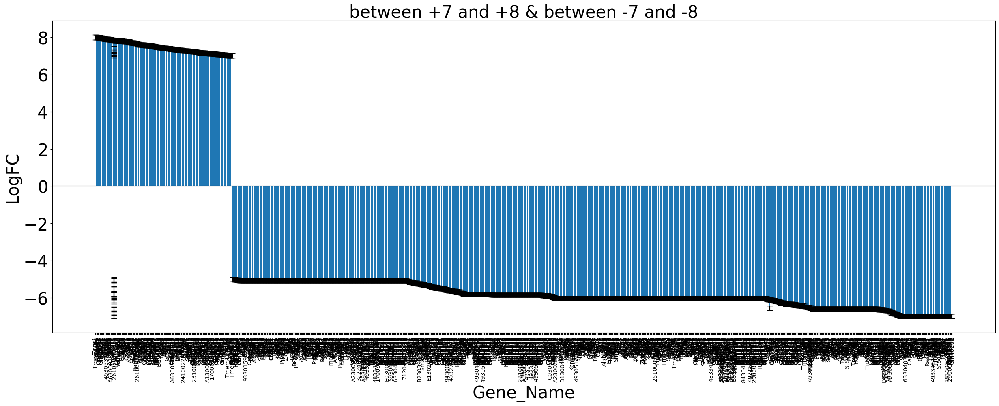

In [ ]:
x = df_n78['Gene']
y = df_n78['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,10))
plt.bar(x, y, yerr = standard_error_mean, capsize = 5)
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=10)
plt.yticks(fontsize=30)
plt.ylabel('LogFC',fontsize=30)
plt.title('between +7 and +8 & between -7 and -8',fontsize=30)

##greter than +8 and less than -8

In [ ]:
df_n810 = df[df['logFC'] >= 8]
df_n810 = df_n810[df_n810['logFC'] <= 10]
df_n810_2 = df[df['logFC'] <= -8]
df_n810_2 = df_n810_2[df_n810_2['logFC'] >= -10]
df_810 = df_n810.append(df_n810_2)
# df_810.sort_values(by=['logFC'])
df_810.reset_index()

,index,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,17,ENSMUSG00000019261.4:Map1s,9.906272,1.830934,15.754134,7.213015e-05,Map1s,ENSMUSG00000019261.4
1,18,ENSMUSG00000022969.14:Il10rb,9.904170,1.826999,15.705415,7.401199e-05,Il10rb,ENSMUSG00000022969.14
2,19,ENSMUSG00000066632.4:Pgk1-rs7,9.869684,2.168440,18.262880,1.924205e-05,Pgk1-rs7,ENSMUSG00000066632.4
3,20,ENSMUSG00000024927.9:Rela,9.856757,1.788168,15.460712,8.423816e-05,Rela,ENSMUSG00000024927.9
4,21,ENSMUSG00000020211.16:Sf3a2,9.817726,1.752284,15.195685,9.692464e-05,Sf3a2,ENSMUSG00000020211.16
...,...,...,...,...,...,...,...,...
336,56945,ENSMUSG00000001270.10:Ckb,-9.731966,1.403341,31.882617,1.637763e-08,Ckb,ENSMUSG00000001270.10
337,56946,ENSMUSG00000040537.18:Adam22,-9.756199,1.427617,32.262171,1.347106e-08,Adam22,ENSMUSG00000040537.18
338,56947,ENSMUSG00000027797.16:Dclk1,-9.783713,1.456460,32.718879,1.064978e-08,Dclk1,ENSMUSG00000027797.16
339,56948,ENSMUSG00000035864.15:Syt1,-9.859948,1.533402,33.670284,6.529050e-09,Syt1,ENSMUSG00000035864.15


Mean: 0.820358084807641
Standard Deviation: 8.605569576733041
Standard Error of the Mean (SEM): 0.46601772001346603
The Total no of genes in the required dataste are :  341


Text(0.5, 1.0, 'greter than +8 and less than -8')

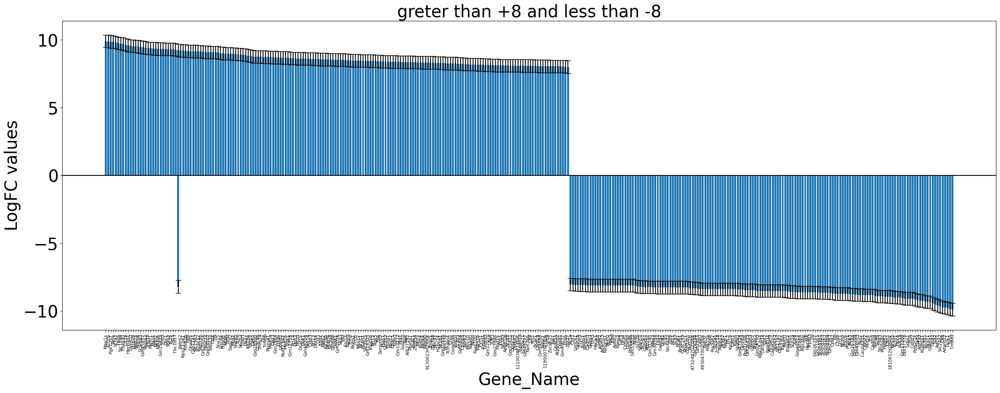

In [ ]:
x = df_810['Gene']
y = df_810['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,10))
plt.bar(x, y, yerr = standard_error_mean, capsize = 5)
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=8)
plt.yticks(fontsize=30)
plt.ylabel('LogFC values',fontsize=30)
plt.title('greter than +8 and less than -8',fontsize=30)

###between +8 and +9 & between -8 and -9

In [ ]:
df_89_1 = df[df['logFC'] >= 8]
df_89_1 = df_89_1[df_89_1['logFC'] <= 9]
df_89_2 = df[df['logFC'] <= -8]
df_89_2 = df_89_2[df_89_2['logFC'] >= -9]
df_n89 = df_89_1.append(df_89_2)
# df_n89.sort_values(by=['logFC'])
df_n89.reset_index()

,index,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,65,ENSMUSG00000035621.14:Midn,8.989719,1.027867,10.106144,0.001478,Midn,ENSMUSG00000035621.14
1,66,ENSMUSG00000003680.17:Taf6l,8.985901,1.024362,10.083767,0.001496,Taf6l,ENSMUSG00000003680.17
2,67,ENSMUSG00000026955.14:Sapcd2,8.983646,1.017128,10.039684,0.001532,Sapcd2,ENSMUSG00000026955.14
3,68,ENSMUSG00000039069.20:Mtg2,8.963074,0.960721,9.710521,0.001832,Mtg2,ENSMUSG00000039069.20
4,69,ENSMUSG00000031662.9:Snx20,8.961201,0.987534,9.858509,0.001690,Snx20,ENSMUSG00000031662.9
...,...,...,...,...,...,...,...,...
265,56922,ENSMUSG00000025104.14:Hdgfl3,-8.929810,0.525367,20.360498,0.000006,Hdgfl3,ENSMUSG00000025104.14
266,56923,ENSMUSG00000056486.19:Chn1,-8.937272,0.595774,21.027544,0.000005,Chn1,ENSMUSG00000056486.19
267,56924,ENSMUSG00000087595.2:1810012K08Rik,-8.940573,0.465976,19.845769,0.000008,1810012K08Rik,ENSMUSG00000087595.2
268,56925,ENSMUSG00000066392.13:Nrxn3,-8.976170,0.635431,21.471801,0.000004,Nrxn3,ENSMUSG00000066392.13


Mean: 0.1687974421982812
Standard Deviation: 8.44018389384643
Standard Error of the Mean (SEM): 0.5136532342390532
The Total no of genes in the required dataste are :  270


Text(0.5, 1.0, 'between +8 and +9 & between -8 and -9')

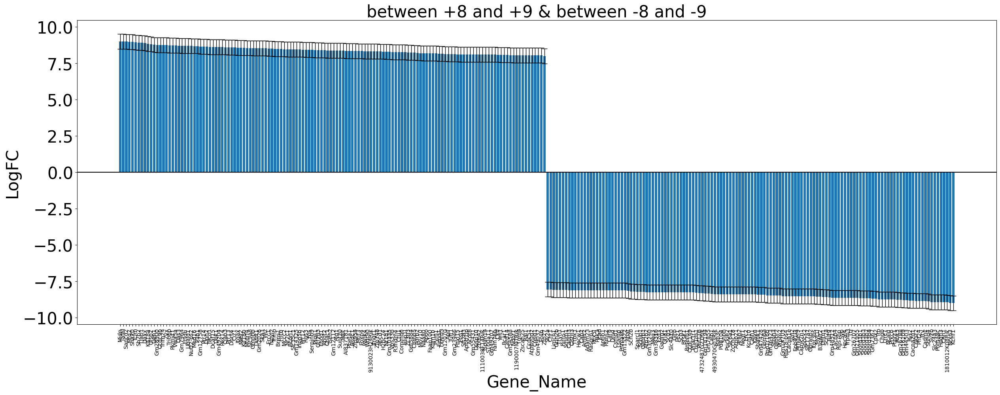

In [ ]:
x = df_n89['Gene']
y = df_n89['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,10))
plt.bar(x, y, yerr = standard_error_mean, error_kw=dict(lw=1, capsize=5, capthick=1))
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=10)
plt.yticks(fontsize=30)
plt.ylabel('LogFC',fontsize=30)
plt.title('between +8 and +9 & between -8 and -9',fontsize=30)

###between +9 and +10 & between -9 and -10

In [ ]:
df_910_1 = df[df['logFC'] >= 9]
df_910_1 = df_910_1[df_910_1['logFC'] <= 10]
df_910_2 = df[df['logFC'] <= -9]
df_910_2 = df_910_2[df_910_2['logFC'] >= -10]
df_n910 = df_910_1.append(df_910_2)
# df_n910.sort_values(by=['logFC'])
df_n910.reset_index()

,index,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,17,ENSMUSG00000019261.4:Map1s,9.906272,1.830934,15.754134,7.213015e-05,Map1s,ENSMUSG00000019261.4
1,18,ENSMUSG00000022969.14:Il10rb,9.904170,1.826999,15.705415,7.401199e-05,Il10rb,ENSMUSG00000022969.14
2,19,ENSMUSG00000066632.4:Pgk1-rs7,9.869684,2.168440,18.262880,1.924205e-05,Pgk1-rs7,ENSMUSG00000066632.4
3,20,ENSMUSG00000024927.9:Rela,9.856757,1.788168,15.460712,8.423816e-05,Rela,ENSMUSG00000024927.9
4,21,ENSMUSG00000020211.16:Sf3a2,9.817726,1.752284,15.195685,9.692464e-05,Sf3a2,ENSMUSG00000020211.16
...,...,...,...,...,...,...,...,...
66,56945,ENSMUSG00000001270.10:Ckb,-9.731966,1.403341,31.882617,1.637763e-08,Ckb,ENSMUSG00000001270.10
67,56946,ENSMUSG00000040537.18:Adam22,-9.756199,1.427617,32.262171,1.347106e-08,Adam22,ENSMUSG00000040537.18
68,56947,ENSMUSG00000027797.16:Dclk1,-9.783713,1.456460,32.718879,1.064978e-08,Dclk1,ENSMUSG00000027797.16
69,56948,ENSMUSG00000035864.15:Syt1,-9.859948,1.533402,33.670284,6.529050e-09,Syt1,ENSMUSG00000035864.15


Mean: 3.298123908815067
Standard Deviation: 8.836444503049611
Standard Error of the Mean (SEM): 1.0486930259867178
The Total no of genes in the required dataste are :  71


Text(0.5, 1.0, 'between +9 and +10 & between -9 and -10')

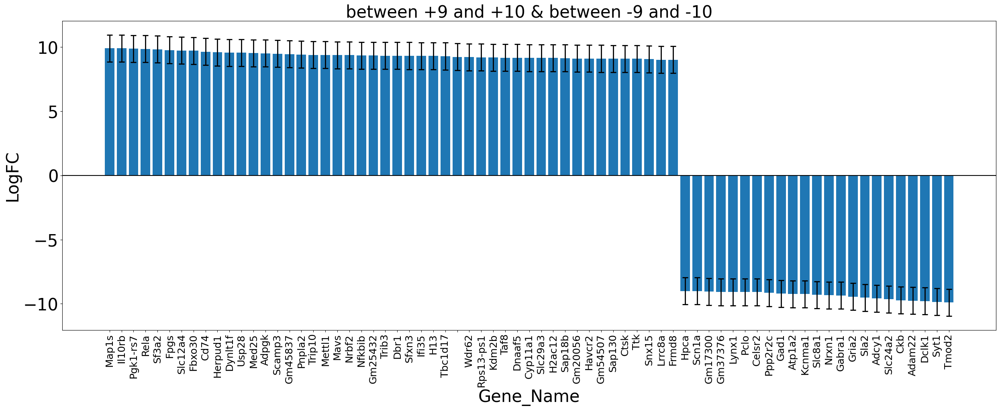

In [ ]:
x = df_n910['Gene']
y = df_n910['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,10))
plt.bar(x, y, yerr = standard_error_mean, error_kw=dict(lw=2, capsize=5, capthick=2))
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=18)
plt.yticks(fontsize=30)
plt.ylabel('LogFC',fontsize=30)
plt.title('between +9 and +10 & between -9 and -10',fontsize=30)

Mean: 3.2981239088150676
Standard Deviation: 8.83644450304961
Standard Error of the Mean (SEM): 1.0486930259867175
The Total no of genes in the required dataste are :  71


Text(0.5, 1.0, 'between +9 and +10 & between -9 and -10')

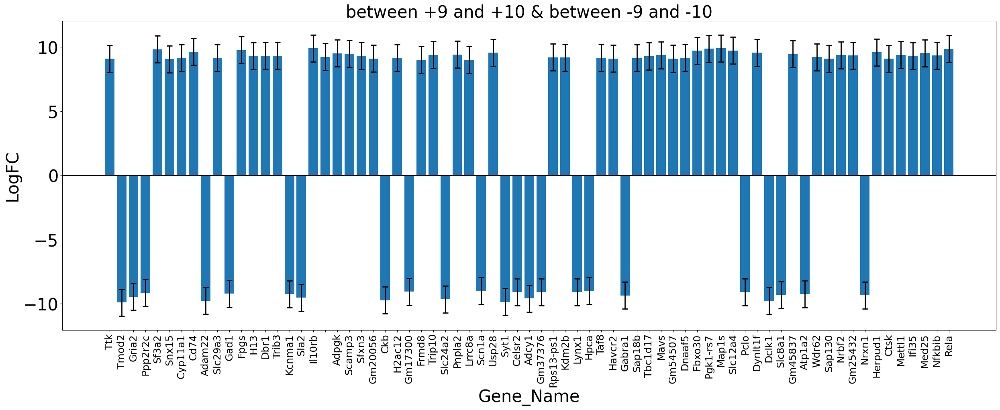

In [ ]:
# this is just the shuffled version of the above plot, and both are same
df_910_1_r = df[df['logFC'] >= 9]
df_910_1_r = df_910_1_r[df_910_1_r['logFC'] <= 10]
df_910_2_r = df[df['logFC'] <= -9]
df_910_2_r = df_910_2_r[df_910_2_r['logFC'] >= -10]
df_n910_r = df_910_1_r.append(df_910_2_r)
df_n910_r = df_n910_r.sample(frac=1.0).reset_index(drop=True)


x = df_n910_r['Gene']
y = df_n910_r['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,10))
plt.bar(x, y, yerr = standard_error_mean, error_kw=dict(lw=2, capsize=5, capthick=2))
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=18)
plt.yticks(fontsize=30)
plt.ylabel('LogFC',fontsize=30)
plt.title('between +9 and +10 & between -9 and -10',fontsize=30)

###grater than +10 and less than -10

In [ ]:
df_n1 = df[df['logFC'] >= 10]
df_n2 = df[df['logFC'] <= -10]
df_n = df_n1.append(df_n2)
# df_n.sort_values(by=['logFC'])
df_n.reset_index()

,index,Gene_Names,logFC,logCPM,LR,PValue,Gene,GeneID
0,0,ENSMUSG00000032487.9:Ptgs2,11.256967,3.095134,23.499642,1.249370e-06,Ptgs2,ENSMUSG00000032487.9
1,1,ENSMUSG00000119427.1:Gm24830,10.985829,2.834435,22.460808,2.144753e-06,Gm24830,ENSMUSG00000119427.1
2,2,ENSMUSG00000119774.1:Gm26232,10.985829,2.834435,22.460808,2.144753e-06,Gm26232,ENSMUSG00000119774.1
3,3,ENSMUSG00000118677.1:Rnu1b6,10.950429,2.800467,22.242859,2.402506e-06,Rnu1b6,ENSMUSG00000118677.1
4,4,ENSMUSG00000064380.3:Gm26448,10.887848,2.743674,21.930482,2.827075e-06,Gm26448,ENSMUSG00000064380.3
5,5,ENSMUSG00000117748.2:Derpc,10.878822,2.730538,21.773747,3.067692e-06,Derpc,ENSMUSG00000117748.2
6,6,ENSMUSG00000020893.18:Per1,10.788801,2.650102,21.354858,3.816523e-06,Per1,ENSMUSG00000020893.18
7,7,ENSMUSG00000068856.4:Sf3b4,10.716021,2.581248,20.929360,4.765346e-06,Sf3b4,ENSMUSG00000068856.4
8,8,ENSMUSG00000030826.20:Bcat2,10.344742,2.233149,18.827414,1.430955e-05,Bcat2,ENSMUSG00000030826.20
9,9,ENSMUSG00000080076.5:H2ac14-ps,10.319466,2.198111,18.296953,1.890092e-05,H2ac14-ps,ENSMUSG00000080076.5


Mean: 7.380695591384028
Standard Deviation: 7.7156697889933055
Standard Error of the Mean (SEM): 1.7252762140130489
The Total no of genes in the required dataste are :  20


Text(0.5, 1.0, 'greater than +10 and less than -10')

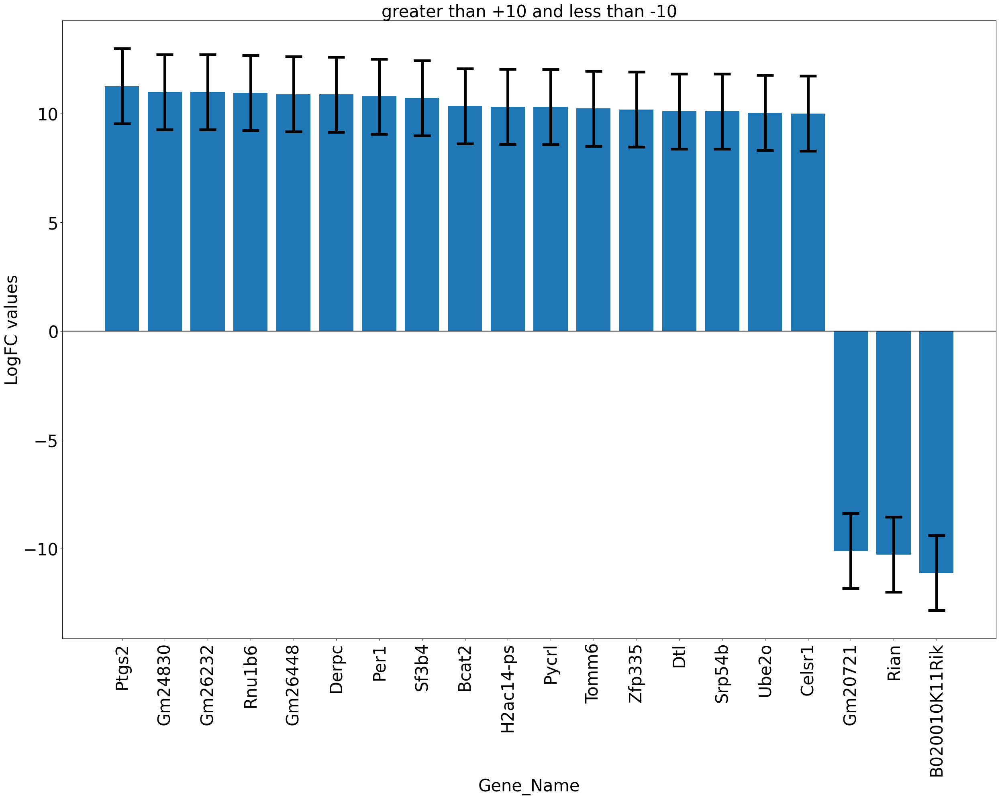

In [ ]:
x = df_n['Gene']
y = df_n['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,20))
plt.bar(x, y, yerr = standard_error_mean, error_kw=dict(lw=5, capsize=15, capthick=5))
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=30)
plt.yticks(fontsize=30)
plt.ylabel('LogFC values',fontsize=30)
plt.title('greater than +10 and less than -10',fontsize=30)

Mean: 7.380695591384027
Standard Deviation: 7.7156697889933055
Standard Error of the Mean (SEM): 1.7252762140130489
The Total no of genes in the required dataste are :  20


Text(0.5, 1.0, 'grater than +10 and less than -10')

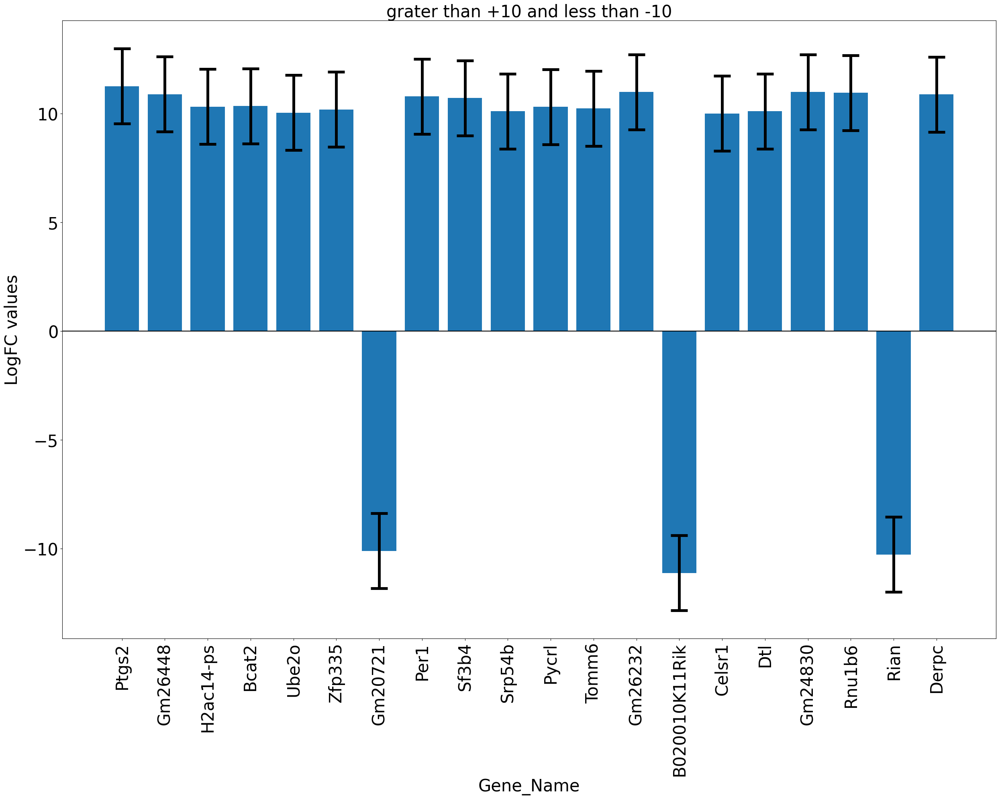

In [ ]:
# this is just the shuffled version of the above plot, and both are same

df_n1_r = df[df['logFC'] >= 10]
df_n2_r = df[df['logFC'] <= -10]
df_n_r = df_n1_r.append(df_n2_r)
df_n_r = df_n_r.sample(frac=1.0).reset_index(drop=True)


x = df_n_r['Gene']
y = df_n_r['logFC']
mean_value = np.mean(y)
standard_deviation = np.std(y, ddof=1)
sample_size = len(y)
standard_error_mean = standard_deviation / np.sqrt(sample_size)

print("Mean:", mean_value)
print("Standard Deviation:", standard_deviation)
print("Standard Error of the Mean (SEM):", standard_error_mean)
print("The Total no of genes in the required dataste are : ", len(x))

plt.figure(figsize = (30,20))
plt.bar(x, y, yerr = standard_error_mean, error_kw=dict(lw=5, capsize=15, capthick=5))
plt.axhline(y=0, color='black', linestyle='-')
plt.xlabel('Gene_Name',fontsize=30)
plt.xticks(rotation = 90,fontsize=30)
plt.yticks(fontsize=30)
plt.ylabel('LogFC values',fontsize=30)
plt.title('grater than +10 and less than -10',fontsize=30)

<Axes: >

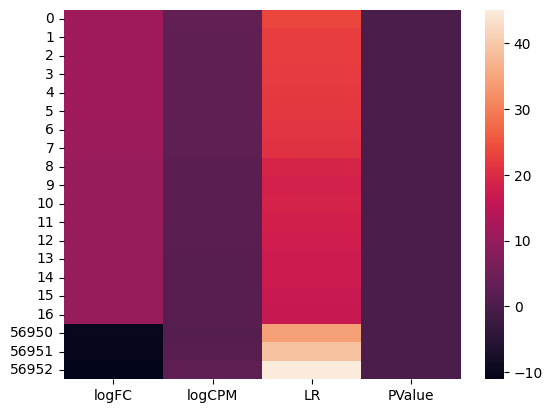

In [ ]:
import seaborn as sns
sns.heatmap(data = df_n[["logFC", "logCPM", "LR", "PValue"]])

# 01_BhagirathN_BhagirathT_DGE[1]

In [ ]:
df1 = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/EEN2020_DESIGN PRACTICAL EXPERIENCE/01_BhagirathN_BhagirathT_DGE[1].xlsx")
df1

,GeneName/ID,Locus,FPKM_BhagirathN,FPKM_BhagirathT,log2Foldchange,Pvalue,Significance,Gene_Description
0,"ENSG00000216863,ENSG00000241216",Chr_6:6346697-6655216,0.036441,3.939130,6.75616,0.05300,No,Please refer to the supplement sheet
1,ENSG00000196990,Chr_9:136444078-136451319,0.356838,27.414900,6.26354,0.13360,No,family with sequence similarity 163%2C member ...
2,ENSG00000197430,Chr_10:98102972-98119092,0.090916,6.820690,6.22924,0.01205,Yes,oligodendrocytic myelin paranodal and inner lo...
3,ENSG00000169271,Chr_5:53751444-53752207,0.120920,8.500330,6.13539,0.24365,No,heat shock 27kDa protein 3 [Source:HGNC Symbol...
4,ENSG00000261786,Chr_3:44158790-44163857,0.014649,1.024330,6.12777,0.24360,No,description not available
...,...,...,...,...,...,...,...,...
16230,ENSG00000105697,Chr_19:35771618-35776046,84.438200,0.805829,-6.71128,0.03285,Yes,hepcidin antimicrobial peptide [Source:HGNC Sy...
16231,ENSG00000012223,Chr_3:46477135-46526724,657.666000,5.079090,-7.01664,0.00005,Yes,lactotransferrin [Source:HGNC Symbol%3BAcc:6720]
16232,ENSG00000013588,Chr_12:13043715-13070871,6.319240,0.034480,-7.51784,0.01610,Yes,G protein-coupled receptor%2C family C%2C grou...
16233,ENSG00000163734,Chr_4:74902305-74904524,29.322700,0.147141,-7.63868,0.10415,No,chemokine (C-X-C motif) ligand 3 [Source:HGNC ...


In [ ]:
df1.sort_values(by=['Significance'])

,GeneName/ID,Locus,FPKM_BhagirathN,FPKM_BhagirathT,log2Foldchange,Pvalue,Significance,Gene_Description
0,"ENSG00000216863,ENSG00000241216",Chr_6:6346697-6655216,0.036441,3.939130,6.756160,0.05300,No,Please refer to the supplement sheet
10518,ENSG00000123268,Chr_12:51157492-51214905,10.517400,8.343980,-0.333968,0.66355,No,activating transcription factor 1 [Source:HGNC...
10519,ENSG00000196387,Chr_12:133656423-133684130,10.737900,8.518890,-0.333970,0.65690,No,zinc finger protein 140 [Source:HGNC Symbol%3B...
10520,ENSG00000175084,Chr_2:220283098-220291461,1.042040,0.826694,-0.333985,0.77125,No,desmin [Source:HGNC Symbol%3BAcc:2770]
10521,"ENSG00000110713,ENSG00000129749",Chr_11:3686816-3847601,10.711400,8.496750,-0.334164,0.64130,No,Please refer to the supplement sheet
...,...,...,...,...,...,...,...,...
15474,ENSG00000102144,Chr_X:77320684-77384793,405.581000,115.907000,-1.807030,0.02630,Yes,phosphoglycerate kinase 1 [Source:HGNC Symbol%...
15476,ENSG00000185022,Chr_22:38507501-38612518,21.265000,6.066790,-1.809480,0.04200,Yes,v-maf avian musculoaponeurotic fibrosarcoma on...
15477,ENSG00000093072,Chr_22:17660193-17702879,10.578800,3.017760,-1.809620,0.02490,Yes,cat eye syndrome chromosome region%2C candidat...
428,ENSG00000178965,Chr_1:75033794-75139422,0.470335,3.587430,2.931190,0.01715,Yes,chromosome 1 open reading frame 173 [Source:HG...


In [ ]:
print('max =', df1.log2Foldchange.max(), '--- min =', df1.log2Foldchange.min())

max = 6.75616 --- min = -8.36662


In [ ]:
fig1 = px.scatter(x=[fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if ((fc >= 5 and fc <= 10) or (fc <= -5 and fc >= -10))],
            y=[p for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if ((fc >= 5 and fc <= 10) or (fc <= -5 and fc >= -10))],
            text=[p for fc, p in zip(df1.log2Foldchange, df1['GeneName/ID']	) if ((fc >= 5 and fc <= 10) or (fc <= -5 and fc >= -10))],
                  labels={'text': 'Data Points'})
fig2 = px.scatter(x=[fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))],
            y=[p for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))],
            text=[p for fc, p in zip(df1.log2Foldchange, df1['GeneName/ID']	) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))])
fig3 = px.scatter(x=[fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if (fc < 3 and fc > -3)],
            y=[p for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if ((fc < 3 and fc > -3))],
            text=[p for fc, p in zip(df1.log2Foldchange, df1['GeneName/ID']	) if ((fc < 3 and fc > -3))])
# fig8 = px.scatter(x=[fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if (fc > 10 or fc < -10)],
#             y=[p for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if (fc > 10 or fc < -10)],
#             text=[p for fc, p in zip(df1.log2Foldchange, df1['GeneName/ID']	) if (fc > 10 or fc < -10)])

fig1.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')
fig2.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')
fig3.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')
# fig8.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')

fig1.update_layout(
    showlegend=True,
    width = 1400,
    height = 800,
    xaxis_title="Fold Change",
    yaxis_title="PVaPvaluelue",
    title="Volcano Plot for '01_BhagirathN_BhagirathT_DGE[1]'",
    title_font=dict(size=30),
    xaxis=dict(title_font=dict(size=30)),
    yaxis=dict(title_font=dict(size=30)),
    font=dict(size=30),
    title_x=0.5)
fig1.update_yaxes(range=[max(df1.Pvalue)+.05,min(df1.Pvalue)-.05])

fig8.update_traces(marker=dict(color='green'))
fig1.update_traces(marker=dict(color='darkorange'))
fig2.update_traces(marker=dict(color='red'))
fig3.update_traces(marker=dict(color='gray'))


fig4 = px.line(x=[5,5],y=[-0.5,1.5])
fig5 = px.line(x=[-5,-5],y=[-0.5,1.5])
fig6 = px.line(x=[3,3],y=[-0.5,1.5])
fig7 = px.line(x=[-3,-3],y=[-0.5,1.5])
fig9 = px.line(x=[-10,-10],y=[-0.5,1.5])
fig10 = px.line(x=[10,10],y=[-0.5,1.5])
for trace in fig2.data:
    fig1.add_trace(trace)
for trace in fig3.data:
    fig1.add_trace(trace)
for trace in fig4.data:
    fig1.add_trace(trace)
for trace in fig5.data:
    fig1.add_trace(trace)
for trace in fig6.data:
    fig1.add_trace(trace)
for trace in fig7.data:
    fig1.add_trace(trace)
# for trace in fig8.data:
#     fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig10.data:
    fig1.add_trace(trace)

fig1.update_xaxes(tickfont=dict(size=30))
fig1.update_yaxes(tickfont=dict(size=30))
fig1.show()

In [ ]:
print("No. of Genes with logFC >= +3 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if fc >= 3]))
print("No. of Genes with logFC <= -3 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if fc <= -3]))
print("No. of Genes beyond -3 and +3 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if (fc >= 3 or fc <= -3)]))
print("\nNo. of Genes within -3 and +3 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if (fc < 3 and fc > -3)]))
print("\nNo. of Genes between -3 to -5 and +3 to +5 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))]))
print("\nNo. of Genes within -5 and +5 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if (fc < 5 and fc > -5)]))
print("\nNo. of Genes with logFC >= +5 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if fc >= 5]))
print("No. of Genes with logFC <= -5 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if fc <= -5]))
print("No. of Genes beyond -5 and +5 is:", len([fc for fc, p in zip(df1.log2Foldchange, df1.Pvalue) if (fc >= 5 or fc <= -5)]))



No. of Genes with logFC >= +3 is: 402
No. of Genes with logFC <= -3 is: 188
No. of Genes beyond -3 and +3 is: 590

No. of Genes within -3 and +3 is: 15645

No. of Genes between -3 to -5 and +3 to +5 is: 535

No. of Genes within -5 and +5 is: 16180

No. of Genes with logFC >= +5 is: 31
No. of Genes with logFC <= -5 is: 24
No. of Genes beyond -5 and +5 is: 55


In [ ]:
df1_n1 = df1[df1['log2Foldchange'] >= 5]
df1_n2 = df1[df1['log2Foldchange'] <= -5]
df1_n = df1_n1.append(df1_n2)
df1_n.reset_index()

,index,GeneName/ID,Locus,FPKM_BhagirathN,FPKM_BhagirathT,log2Foldchange,Pvalue,Significance,Gene_Description
0,0,"ENSG00000216863,ENSG00000241216",Chr_6:6346697-6655216,0.036441,3.939130,6.75616,0.05300,No,Please refer to the supplement sheet
1,1,ENSG00000196990,Chr_9:136444078-136451319,0.356838,27.414900,6.26354,0.13360,No,family with sequence similarity 163%2C member ...
2,2,ENSG00000197430,Chr_10:98102972-98119092,0.090916,6.820690,6.22924,0.01205,Yes,oligodendrocytic myelin paranodal and inner lo...
3,3,ENSG00000169271,Chr_5:53751444-53752207,0.120920,8.500330,6.13539,0.24365,No,heat shock 27kDa protein 3 [Source:HGNC Symbol...
4,4,ENSG00000261786,Chr_3:44158790-44163857,0.014649,1.024330,6.12777,0.24360,No,description not available
5,5,ENSG00000107147,Chr_9:138594030-138684992,0.033264,1.987100,5.90056,0.00125,Yes,potassium channel%2C subfamily T%2C member 1 [...
6,6,ENSG00000157219,Chr_7:154858776-154877459,0.051464,2.291430,5.47653,0.24725,No,5-hydroxytryptamine (serotonin) receptor 5A%2C...
7,7,ENSG00000272321,Chr_8:99413630-99955055,0.030915,1.352540,5.45123,0.26030,No,description not available
8,8,ENSG00000225978,Chr_20:61726844-61735738,0.287958,12.577500,5.44885,0.07045,No,highly accelerated region 1A (non-protein codi...
9,9,ENSG00000148795,Chr_10:104590287-104597290,0.036572,1.596440,5.44799,0.15895,No,cytochrome P450%2C family 17%2C subfamily A%2C...


# 02_SalaudeenN_SalaudeenT_DGE[1]

In [ ]:
df2 = pd.read_excel("/content/drive/MyDrive/Colab Notebooks/EEN2020_DESIGN PRACTICAL EXPERIENCE/02_SalaudeenN_SalaudeenT_DGE[1].xlsx")
df2

,GeneName/ID,Locus,FPKM_SalaudeenN,FPKM_SalaudeenT,log2Foldchange,Pvalue,Significance,Gene_Description
0,ENSG00000134668,Chr_1:32254730-32281652,0.068089,123.108000,10.82020,0.00095,Yes,SPOC domain containing 1 [Source:HGNC Symbol%3...
1,ENSG00000170290,Chr_11:107578103-107595135,0.589558,201.557000,8.41734,0.06325,No,sarcolipin [Source:HGNC Symbol%3BAcc:11089]
2,ENSG00000137673,Chr_11:102391238-102401484,0.187108,62.006400,8.37240,0.12105,No,matrix metallopeptidase 7 (matrilysin%2C uteri...
3,ENSG00000100985,Chr_20:44637546-44688784,1.847070,503.612000,8.09093,0.08725,No,matrix metallopeptidase 9 (gelatinase B%2C 92k...
4,ENSG00000169429,Chr_4:74606222-74609433,0.505434,124.924000,7.94932,0.02130,Yes,interleukin 8 [Source:HGNC Symbol%3BAcc:6025]
...,...,...,...,...,...,...,...,...
15951,ENSG00000207955,Chr_9:131153739-131155789,36.352100,0.042985,-9.72398,0.22110,No,microRNA 219-2 [Source:HGNC Symbol%3BAcc:31598]
15952,ENSG00000164796,Chr_8:113235156-114449328,3.931300,0.004576,-9.74666,0.00415,Yes,CUB and Sushi multiple domains 3 [Source:HGNC ...
15953,ENSG00000064787,Chr_20:52553315-52687304,127.487000,0.124817,-9.99631,0.03375,Yes,breast carcinoma amplified sequence 1 [Source:...
15954,ENSG00000164089,Chr_4:109663195-109684210,64.494600,0.044648,-10.49640,0.00915,Yes,ethanolamine-phosphate phospho-lyase [Source:H...


In [ ]:
print('max =', df2.log2Foldchange.max(), '--- min =', df2.log2Foldchange.min())

max = 10.8202 --- min = -10.821


In [ ]:
fig1 = px.scatter(x=[fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if ((fc >= 5 and fc < 8) or (fc <= -5 and fc > -8))],
            y=[p for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if ((fc >= 5 and fc < 8) or (fc <= -5 and fc > -8))],
            text=[p for fc, p in zip(df2.log2Foldchange, df2['GeneName/ID']	) if ((fc >= 5 and fc < 8) or (fc <= -5 and fc > -8))],
                  labels={'text': 'Data Points'})
fig2 = px.scatter(x=[fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))],
            y=[p for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))],
            text=[p for fc, p in zip(df2.log2Foldchange, df2['GeneName/ID']	) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))])
fig3 = px.scatter(x=[fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc < 3 and fc > -3)],
            y=[p for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if ((fc < 3 and fc > -3))],
            text=[p for fc, p in zip(df2.log2Foldchange, df2['GeneName/ID']	) if ((fc < 3 and fc > -3))])
fig8 = px.scatter(x=[fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc >= 8 or fc <= -8)],
            y=[p for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc >= 8 or fc <= -8)],
            text=[p for fc, p in zip(df2.log2Foldchange, df2['GeneName/ID']	) if (fc >= 8 or fc <= -8)])

fig1.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')
fig2.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')
fig3.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')
fig8.update_traces(texttemplate=' ', hovertemplate='Gene_ID: %{text}<br>logFC= %{x}<br>Pvalue: %{y}')

fig1.update_layout(
    showlegend=True,
    width = 1400,
    height = 800,
    xaxis_title="Fold Change",
    yaxis_title="PVaPvaluelue",
    title="Volcano Plot for '02_SalaudeenN_SalaudeenT_DGE[1]'",
    title_font=dict(size=30),
    xaxis=dict(title_font=dict(size=30)),
    yaxis=dict(title_font=dict(size=30)),
    font=dict(size=30),
    title_x=0.5)
fig1.update_yaxes(range=[max(df1.Pvalue)+.05,min(df1.Pvalue)-.05])

fig8.update_traces(marker=dict(color='green'))
fig1.update_traces(marker=dict(color='darkorange'))
fig2.update_traces(marker=dict(color='red'))
fig3.update_traces(marker=dict(color='gray'))


fig4 = px.line(x=[5,5],y=[-0.5,1.5])
fig5 = px.line(x=[-5,-5],y=[-0.5,1.5])
fig6 = px.line(x=[3,3],y=[-0.5,1.5])
fig7 = px.line(x=[-3,-3],y=[-0.5,1.5])
fig9 = px.line(x=[-8,-8],y=[-0.5,1.5])
fig10 = px.line(x=[8,8],y=[-0.5,1.5])
for trace in fig2.data:
    fig1.add_trace(trace)
for trace in fig3.data:
    fig1.add_trace(trace)
for trace in fig4.data:
    fig1.add_trace(trace)
for trace in fig5.data:
    fig1.add_trace(trace)
for trace in fig6.data:
    fig1.add_trace(trace)
for trace in fig7.data:
    fig1.add_trace(trace)
for trace in fig8.data:
    fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig9.data:
    fig1.add_trace(trace)
for trace in fig10.data:
    fig1.add_trace(trace)

fig1.update_xaxes(tickfont=dict(size=30))
fig1.update_yaxes(tickfont=dict(size=30))
fig1.show()

In [ ]:
print("No. of Genes with logFC >= +3 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if fc >= 3]))
print("No. of Genes with logFC <= -3 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if fc <= -3]))
print("No. of Genes beyond -3 and +3 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc >= 3 or fc <= -3)]))
print("\nNo. of Genes within -3 and +3 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc < 3 and fc > -3)]))
print("\nNo. of Genes between -3 to -5 and +3 to +5 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if ((fc >= 3 and fc < 5) or (fc <= -3 and fc > -5))]))
print("\nNo. of Genes within -5 and +5 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc < 5 and fc > -5)]))
print("\nNo. of Genes with logFC >= +5 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if fc >= 5]))
print("No. of Genes with logFC <= -5 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if fc <= -5]))
print("No. of Genes beyond -5 and +5 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc >= 5 or fc <= -5)]))
print("\nNo. of Genes between -5 to -8 and +5 to +8 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if ((fc >= 5 and fc < 8) or (fc <= -5 and fc > -8))]))
print("\nNo. of Genes within -8 and +8 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc < 8 and fc > -8)]))
print("\nNo. of Genes with logFC >= +8 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if fc >= 8]))
print("No. of Genes with logFC <= -8 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if fc <= -8]))
print("No. of Genes beyond -8 and +8 is:", len([fc for fc, p in zip(df2.log2Foldchange, df2.Pvalue) if (fc >= 8 or fc <= -8)]))

No. of Genes with logFC >= +3 is: 544
No. of Genes with logFC <= -3 is: 1512
No. of Genes beyond -3 and +3 is: 2056

No. of Genes within -3 and +3 is: 13900

No. of Genes between -3 to -5 and +3 to +5 is: 1387

No. of Genes within -5 and +5 is: 15287

No. of Genes with logFC >= +5 is: 119
No. of Genes with logFC <= -5 is: 550
No. of Genes beyond -5 and +5 is: 669

No. of Genes between -5 to -8 and +5 to +8 is: 633

No. of Genes within -8 and +8 is: 15920

No. of Genes with logFC >= +8 is: 4
No. of Genes with logFC <= -8 is: 32
No. of Genes beyond -8 and +8 is: 36


In [ ]:
df2_n1 = df2[df2['log2Foldchange'] >= 8]
df2_n2 = df2[df2['log2Foldchange'] <= -8]
df2_n = df2_n1.append(df2_n2)
df2_n.reset_index()

,index,GeneName/ID,Locus,FPKM_SalaudeenN,FPKM_SalaudeenT,log2Foldchange,Pvalue,Significance,Gene_Description
0,0,ENSG00000134668,Chr_1:32254730-32281652,0.068089,123.108000,10.82020,0.00095,Yes,SPOC domain containing 1 [Source:HGNC Symbol%3...
1,1,ENSG00000170290,Chr_11:107578103-107595135,0.589558,201.557000,8.41734,0.06325,No,sarcolipin [Source:HGNC Symbol%3BAcc:11089]
2,2,ENSG00000137673,Chr_11:102391238-102401484,0.187108,62.006400,8.37240,0.12105,No,matrix metallopeptidase 7 (matrilysin%2C uteri...
3,3,ENSG00000100985,Chr_20:44637546-44688784,1.847070,503.612000,8.09093,0.08725,No,matrix metallopeptidase 9 (gelatinase B%2C 92k...
4,15924,ENSG00000269935,Chr_16:87634131-87799598,9.020150,0.034311,-8.03832,0.35985,No,description not available
5,15925,ENSG00000134201,Chr_1:110254863-110318050,9.199890,0.034822,-8.04549,0.21335,No,glutathione S-transferase mu 5 [Source:HGNC Sy...
6,15926,ENSG00000108684,Chr_17:31340104-32522956,7.799520,0.029325,-8.05512,0.04735,Yes,acid-sensing (proton-gated) ion channel 2 [Sou...
7,15927,ENSG00000174145,Chr_4:37245841-37451087,1.454320,0.005446,-8.06091,0.21365,No,KIAA1239 [Source:HGNC Symbol%3BAcc:29229]
8,15928,ENSG00000182230,Chr_5:175476680-175559261,8.724500,0.032667,-8.06108,0.00005,Yes,family with sequence similarity 153%2C member ...
9,15929,ENSG00000158865,Chr_16:24857161-24922949,7.300300,0.027085,-8.07430,0.00905,Yes,solute carrier family 5 (sodium/inositol cotra...
